# **Diagnosis Predictive Model For Classification Problem**

In [1]:
# importing the libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [2]:
# let try to load the data
df = pd.read_csv("breast_cancer_wisconsin_data.csv")

# Exploratory Data Anaylsis

In [3]:
# lets try to look the data
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
0,87139402,B,12.32,12.39,78.85,464.1,0.10280,0.06981,0.03987,0.03700,...,13.50,15.64,86.97,549.1,0.1385,0.1266,0.12420,0.09391,0.2827,0.06771
1,8910251,B,10.60,18.95,69.28,346.4,0.09688,0.11470,0.06387,0.02642,...,11.88,22.94,78.28,424.8,0.1213,0.2515,0.19160,0.07926,0.2940,0.07587
2,905520,B,11.04,16.83,70.92,373.2,0.10770,0.07804,0.03046,0.02480,...,12.41,26.44,79.93,471.4,0.1369,0.1482,0.10670,0.07431,0.2998,0.07881
3,868871,B,11.28,13.39,73.00,384.8,0.11640,0.11360,0.04635,0.04796,...,11.92,15.77,76.53,434.0,0.1367,0.1822,0.08669,0.08611,0.2102,0.06784
4,9012568,B,15.19,13.21,97.65,711.8,0.07963,0.06934,0.03393,0.02657,...,16.20,15.73,104.50,819.1,0.1126,0.1737,0.13620,0.08178,0.2487,0.06766


#### We load a dataset to perform the classification on it because in dataset we will choose a diagnosis column as a label in which only 2 values B and M . So, its means its a binary column. if dataset label is in contionus format so then our problem related to regression.

In [4]:
# lets try to check the shape of data
df.shape

(569, 32)

In [5]:
# check the column names of data
print(df.columns.tolist())

['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'points_mean', 'symmetry_mean', 'dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'points_se', 'symmetry_se', 'dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'points_worst', 'symmetry_worst', 'dimension_worst']


In [6]:
# lets try to check the general information of all columns in dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 569 non-null    int64  
 1   diagnosis          569 non-null    object 
 2   radius_mean        569 non-null    float64
 3   texture_mean       569 non-null    float64
 4   perimeter_mean     569 non-null    float64
 5   area_mean          569 non-null    float64
 6   smoothness_mean    569 non-null    float64
 7   compactness_mean   569 non-null    float64
 8   concavity_mean     569 non-null    float64
 9   points_mean        569 non-null    float64
 10  symmetry_mean      569 non-null    float64
 11  dimension_mean     569 non-null    float64
 12  radius_se          569 non-null    float64
 13  texture_se         569 non-null    float64
 14  perimeter_se       569 non-null    float64
 15  area_se            569 non-null    float64
 16  smoothness_se      569 non

In [7]:
# lets try to check the missing values of each column in a dataset 
df.isnull().sum()

id                   0
diagnosis            0
radius_mean          0
texture_mean         0
perimeter_mean       0
area_mean            0
smoothness_mean      0
compactness_mean     0
concavity_mean       0
points_mean          0
symmetry_mean        0
dimension_mean       0
radius_se            0
texture_se           0
perimeter_se         0
area_se              0
smoothness_se        0
compactness_se       0
concavity_se         0
points_se            0
symmetry_se          0
dimension_se         0
radius_worst         0
texture_worst        0
perimeter_worst      0
area_worst           0
smoothness_worst     0
compactness_worst    0
concavity_worst      0
points_worst         0
symmetry_worst       0
dimension_worst      0
dtype: int64

## Distribution of Label

B    357
M    212
Name: diagnosis, dtype: int64


[]

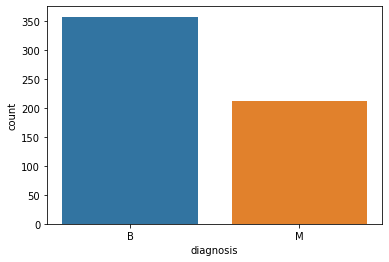

In [8]:
print(df['diagnosis'].value_counts())
sns.countplot(x='diagnosis', data=df)
plt.plot()

#### We can see above we have 357 values belongs to B and 212 values for M.

## Pairplot of All Features

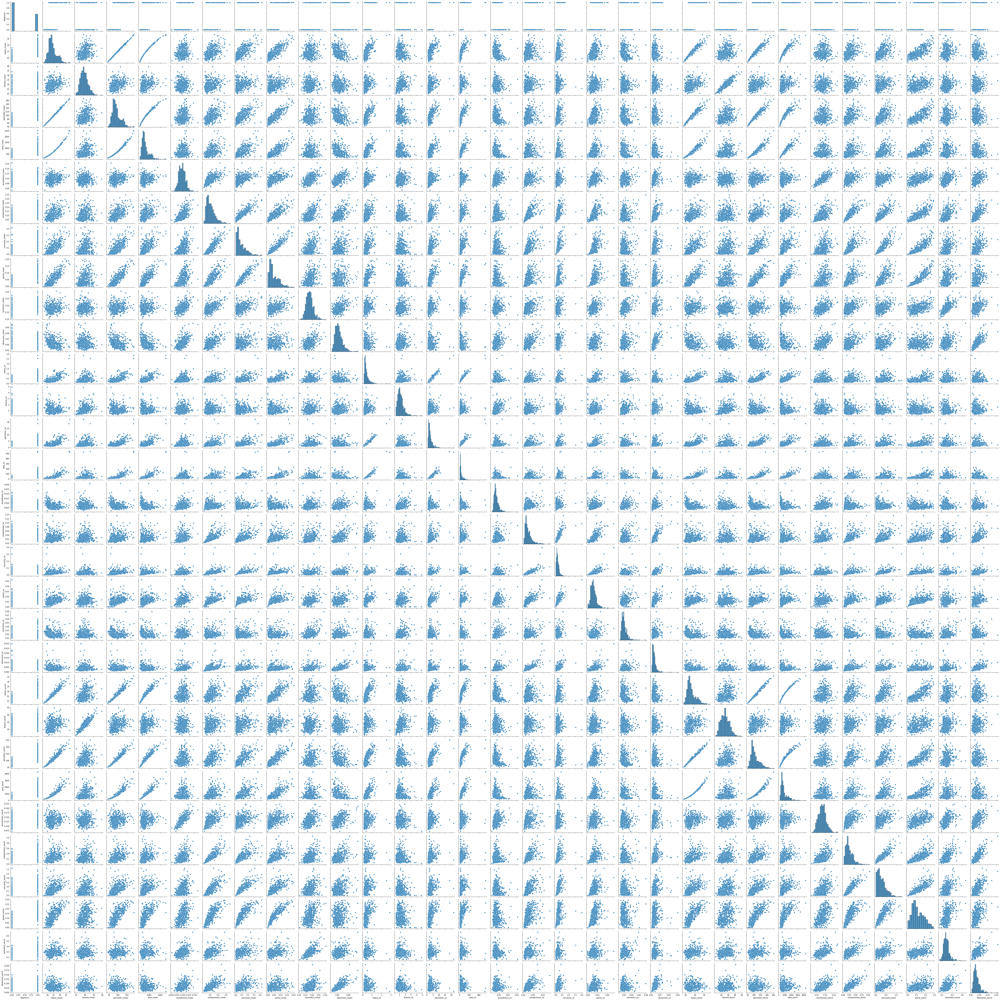

In [21]:
# Overall idea about distribution of data histogram numeric columns## Distribution of categorical variables
# sns.pairplot(df, hue = 'continent', diag_kind = 'kde',
#              plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
#              size = 4)

sns.pairplot(df)
plt.show()

#### From above graph, we can see the relationship between each features using pairplot and most features are normal distibuted as we can see a histogram.

## Jointplot Between 2 Features

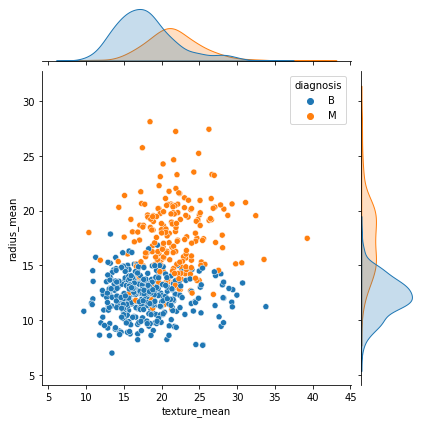

In [10]:
sns.jointplot(data=df, x="texture_mean", y="radius_mean", hue='diagnosis')
plt.show()

#### We plot the jointplot between texture mean and radius mean features against label column diagnosis in which we can see more values belongs to B label.

In [11]:
# lets try to remove the unnecessary columns that are not useful for our prediciton
df.drop(['id'], axis = 1, inplace=True)

## Importing Libraries

In [12]:
import time
#import for preprocessing
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import StandardScaler,LabelEncoder

# import methods for measuring accuracy, precision, recall etc
from sklearn.metrics import (
    accuracy_score, 
    precision_score,
    recall_score,
    roc_auc_score,
    f1_score,
    confusion_matrix,
    classification_report
)

## Label Encoding

In [13]:
'''
Categorical data refers to the information that has specific categories within the dataset. In this dataset above, there are many columns are categorical variables.
Machine Learning models are primarily based on mathematical equations. Thus, you can intuitively understand that keeping the categorical data in the equation will cause certain issues
since you would only need numbers in the equations.
'''
labelEnc = LabelEncoder()
for i in list(df.columns):
    if df[i].dtype == 'object':
        df[i] = labelEnc.fit_transform(df[i])

## Extract Dependent and Independent Variables

In [14]:
X = df.drop('diagnosis', axis = 1)
Y = df['diagnosis']

## Split Train Test

In [15]:
'''
Every dataset for Machine Learning model must be split into two separate sets – training set and test set.
Usually, the dataset is split into 70:30 ratio or 80:20 ratio. This means that you either take 70% or 80% of the data for training the model
while leaving out the rest 30% or 20%. The splitting process varies according to the shape and size of the dataset in question.

'''
# splitting the dataset 80% for training and 20% for testing
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.2, random_state = 0)

In [16]:
# lets try to check the shape of training and testing
print(X_train.shape)
print(X_test.shape)

(455, 30)
(114, 30)


In [17]:
'''
Feature scaling marks the end of the data preprocessing in Machine Learning. It is a method to standardize the independent variables of a dataset within a specific range.
In other words, feature scaling limits the range of variables so that you can compare them on common grounds.

'''
# standardization our data that better for in model prediction because values lies in a specific range (0,1)
st_x= StandardScaler()  
X_train= st_x.fit_transform(X_train) 
X_test= st_x.transform(X_test) 

# Model building - Random Forest

In [18]:
from sklearn.ensemble import RandomForestClassifier

In [19]:
# function for evaluation metrics precision, recall, f1 etc
def modelEvaluation(predictions, y_test_set, model_name):
    # Print model evaluation to predicted result    
    start_time = time.time()
    print("==========",model_name,"==========")
    print ("\nAccuracy on validation set: {:.4f}".format(accuracy_score(y_test_set, predictions)))
    print ("Precision on validation set: {:.4f}".format(precision_score(y_test_set, predictions, average='macro')))    
    print ("Recall on validation set: {:.4f}".format(recall_score(y_test_set, predictions, average='macro')))
    print ("F1_Score on validation set: {:.4f}".format(f1_score(y_test_set, predictions, average='macro')))
    print ("\nClassification report : \n", classification_report(y_test_set, predictions))
    print ("\nConfusion Matrix : \n", confusion_matrix(y_test_set, predictions))
    cm = confusion_matrix(y_test_set, predictions)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    plt.show()
    end = round(time.time()-start_time,3)
    results = [accuracy_score(y_test_set, predictions),precision_score(y_test_set, predictions, average='macro'),
              recall_score(y_test_set, predictions, average='macro'),f1_score(y_test_set, predictions, average='macro'),end]
    return results

========== RandomForestClassifier ==========

Accuracy on validation set: 0.9649
Precision on validation set: 0.9753
Recall on validation set: 0.9459
F1_Score on validation set: 0.9588

Classification report : 
               precision    recall  f1-score   support

           0       0.95      1.00      0.97        77
           1       1.00      0.89      0.94        37

    accuracy                           0.96       114
   macro avg       0.98      0.95      0.96       114
weighted avg       0.97      0.96      0.96       114


Confusion Matrix : 
 [[77  0]
 [ 4 33]]


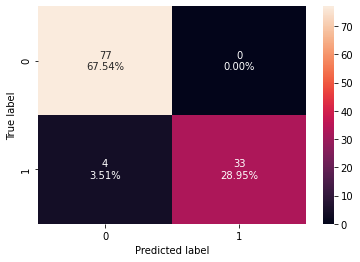

In [20]:
# lets try to check the results on Random Forest
rf = RandomForestClassifier()
rf.fit(X_train, Y_train)
predictions = rf.predict(X_test)
results_rf = modelEvaluation(predictions, Y_test, "RandomForestClassifier")

#### choose the random forest model for classification because the random forest can generalize over the data in a better way. This randomized feature selection makes random forest much more accurate than a decision tree.